In [2]:
import torch
import torch.nn as nn

from matplotlib import pyplot as plt
from matplotlib.pyplot import cm
import numpy as np

from src.model.transop import TransOp_expm
from src.model.l1_inference import infer_coefficients
from src.model.autoencoder import ConvEncoder, ConvDecoder
from src.util.dataloader import load_mnist, load_cifar10, load_celeba, load_celeba64
from src.util.utils import build_nn_graph

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_state = torch.load(f'results/pretrained/celeba64/run1_modelDict_celeba64_M40Z32_finetune.pt', map_location=device)

In [13]:
img_dim = 64
encoder = ConvEncoder(32, 3, img_dim, False,num_filters=128).to(device)
decoder = ConvDecoder(32, 3, img_dim, num_filters=128).to(device)
transOp = TransOp_expm(40, 32).to(device)

encoder.load_state_dict(model_state['encoder'])
decoder.load_state_dict(model_state['decoder'])
transOp.load_state_dict(model_state['transOp'])
dict_mag = model_state['dict_mag']
latent_mag = model_state['latent_mag']
zeta = model_state['zeta']
gamma = model_state['gamma']
latent_scale = model_state['latent_scale']
dict_size = 40
latent_dim = 32

End loss: 2.692E-04


Text(0, 0.5, 'Mag')

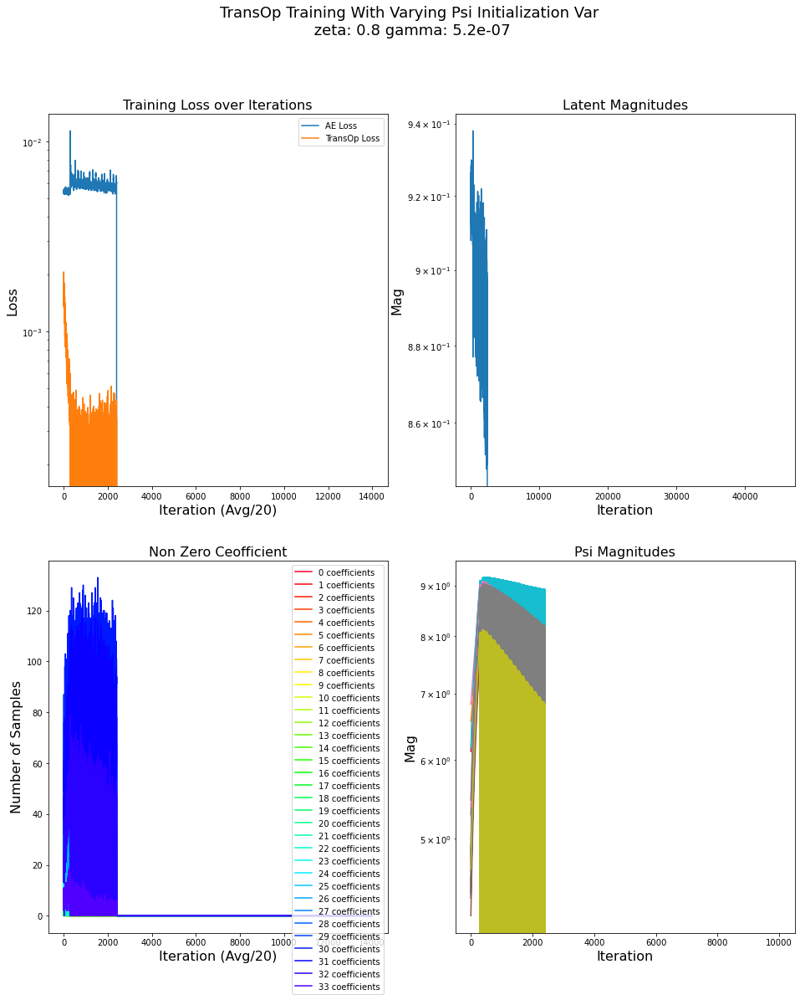

In [14]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16, 18))
fig.suptitle(f"TransOp Training With Varying Psi Initialization Var\n zeta: {zeta:} gamma: {gamma:}", fontsize=18)

#fig.suptitle(f"TransOp Training With Detached Fine-tuning\n zeta: {zeta:} gamma: {gamma:} Interpolate: {interpolate:} Loss weight: {loss_ratio}\n Starting dict_size: {og_dict_size:} Ending dict_size: {dict_size:}", fontsize=18)

#ax[0, 0].semilogy(model_state['ae_loss'].reshape(-1, 20).mean(axis=1), label="AE Loss")
ax[0, 0].semilogy(model_state['ae_loss'][:14000], label="AE Loss")
ax[0, 0].semilogy(model_state['transOp_loss'][:14000], label="TransOp Loss")
#ax[0, 0].semilogy(model_state['transOp_loss'].reshape(-1, 20).mean(axis=1), label="TransOp Loss")
ax[0, 0].set_title("Training Loss over Iterations", fontsize=16)
ax[0, 0].set_xlabel("Iteration (Avg/20)", fontsize=16)
ax[0, 0].legend()
ax[0, 0].set_ylabel("Loss", fontsize=16)

print(f"End loss: {model_state['transOp_loss'][model_state['transOp_loss'] > 0][-1]:.3E}")

ax[0, 1].semilogy(model_state['latent_mag'])
ax[0, 1].set_title("Latent Magnitudes", fontsize=16)
ax[0, 1].set_xlabel("Iteration", fontsize=16)
ax[0, 1].set_ylabel("Mag", fontsize=16)

nz_coeff = model_state['nz_coeff'][:14000]
indices = [k for k in range(model_state['nz_coeff'].shape[1]) if (nz_coeff[:, k] != 0).any()]
NUM_COLORS = dict_size
cm = plt.get_cmap('gist_rainbow')
ax[1, 0].set_prop_cycle('color', [cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])
#color = iter(cm.viridis(np.linspace(1, 0, len(indices))))
for k in indices[:40]:
    #c = next(color)
    ax[1, 0].plot(nz_coeff[:, k], label=f'{k:} coefficients')
ax[1, 0].set_title("Non Zero Ceofficient", fontsize=16)
ax[1, 0].set_xlabel("Iteration (Avg/20)", fontsize=16)
ax[1, 0].set_ylabel("Number of Samples", fontsize=16)
ax[1, 0].legend()

psi_mag = model_state['dict_mag'][:10000]
for k in range(psi_mag.shape[1]):
    ax[1, 1].semilogy(psi_mag[:, k])
ax[1, 1].set_title("Psi Magnitudes", fontsize=16)
ax[1, 1].set_xlabel("Iteration", fontsize=16)
ax[1, 1].set_ylabel("Mag", fontsize=16)


In [28]:
from src.util.dataloader import load_index_dataset

train_loader = load_index_dataset('./data', 50, np.arange(150000), dataset="celeba", shuffle=True, data_type="train")

In [29]:
from src.model.attribute_resnet import resnet50
model = resnet50().to(device)
clf_state = torch.load('results/pretrained/celeba64_attr_classifier.pt')
model.load_state_dict(clf_state['classifier'])
attr_list = ["5_o_Clock_Shadow", "Arched_Eyebrows", "Attractive", "Bags_Under_Eyes",
             "Bald", "Bangs", "Big_Lips", "Big_Nose", "Black Hair", "Blonde Hair",
             "Blurry", "Brown Hair", "Bushy_Eyebrows", "Chubby", "Double_Chin",
             "Eyeglasses", "Goatee", "Gray_Hair", "Heavy_Makeup", "High_Cheekbones",
             "Male", "Mouth_Slightly_Open", "Mustache", "Narrow_Eyes", "No_Beard",
             "Oval_Face", "Pale Skin", "Pointy_Nose", "Receding Hairline", 
             "Rosy_Cheeks", "Sideburns", "Smiling", "Straight_Hair", 
             "Wavy_Hair", "Wearing_Earrings", "Wearing_Hat", "Wearing_Lipstick",
             "Wearing_Necklace", "Wearing_Necktie", "Young"]

psi = transOp.get_psi()
mean_norm = psi.reshape(len(psi), -1).norm(dim=1).mean()
std_norm = psi.reshape(len(psi), -1).norm(dim=1).std()
psi_use = torch.where(psi.reshape(len(psi), -1).norm(dim=1) > (mean_norm - std_norm))[0]

Initialized model with pretrained weights from https://download.pytorch.org/models/resnet50-19c8e357.pth


In [30]:
x, label, idx = next(iter(train_loader))
x = x.to(device)
z = encoder(x)/latent_scale
x_dec = decoder(z*latent_scale)

# Generate Augmentations

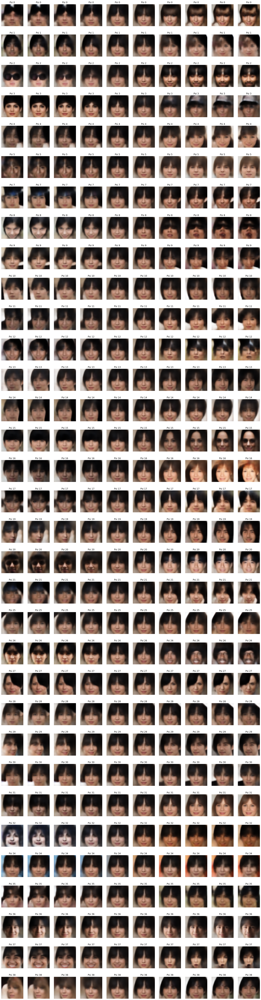

In [42]:
from scipy.linalg import expm

coeff_range = 0.3
index = 3

psi = transOp.get_psi().detach().cpu()
mean_norm = psi.reshape(len(psi), -1).norm(dim=1).mean()
std_norm = psi.reshape(len(psi), -1).norm(dim=1).std()
psi_use = torch.where(psi.reshape(len(psi), -1).norm(dim=1) > (mean_norm - std_norm))[0]
#psi_use = torch.argsort(psi.reshape(len(psi), -1).norm(dim=1))[-20:]
#psi_use = np.arange(40)
fig, ax = plt.subplots(nrows=len(psi_use), ncols=10, figsize=(25, len(psi_use)*3))
for idx, k in enumerate(psi_use):

    coeff_interp = np.zeros((10, dict_size))
    coeff_interp[:, k] = np.linspace(-coeff_range, coeff_range, 10)

    x_interp = []

    for i, coeff in enumerate(coeff_interp):
        coeff = torch.tensor(coeff).float().to('cuda').repeat(len(z), 1)
        transOp.set_coefficients(coeff)
        z1_hat = transOp(z.unsqueeze(-1)).squeeze()
        z0_dec = decoder(z1_hat*latent_scale)[index]
        ax[idx, i].imshow(z0_dec.permute(1, 2, 0).detach().cpu().numpy())
        ax[idx, i].set_title(f"Psi {k}")


[axi.set_axis_off() for axi in ax.ravel()]
print()

# Attribute Classifier

To generate augmentations with corresponding attribute classifier, use the below function with the operator index, the attribute classifier index (found from list two above), and coefficient range.

In [35]:
def plot_attr_augmentations(psi_index, class_indices, coeff_range, num_steps=15, num_samples=10):

    for index in range(num_samples):
        fig = plt.figure(figsize=(25, 5))
        coeff_interp = np.zeros((num_steps, dict_size))
        coeff_interp[:, psi_index] = np.linspace(-coeff_range, coeff_range, num_steps)

        x_interp = []
        class_est = np.zeros((num_steps, len(class_indices)))

        for i, coeff in enumerate(coeff_interp):
            ax = fig.add_subplot(2, num_steps, i+1)

            coeff = torch.tensor(coeff).float().to('cuda').repeat(len(z), 1)
            transOp.set_coefficients(coeff)
            z1_hat = transOp(z.unsqueeze(-1)).squeeze()
            z0_dec = decoder(z1_hat*latent_scale)

            label_est = model(z0_dec)
            for j, c in enumerate(class_indices):
                class_est[i, j] = label_est[c].softmax(dim=1)[index, 1]

            ax.imshow(z0_dec[index].permute(1, 2, 0).detach().cpu().numpy())
            ax.set_axis_off()


        ax = fig.add_subplot(2, 1, 2)
        x = np.arange(num_steps)
        for j, c in enumerate(class_indices):
            ax.plot(coeff_interp[:, psi_index], class_est[:, j], label=attr_list[c], linewidth=3)
        ax.legend(fontsize=16)
        ax.set_ylim([0, 1])
        ax.set_xlabel("Coefficient Value", fontsize=18)
        ax.set_ylabel("Attribute \nPrediction", fontsize=18)

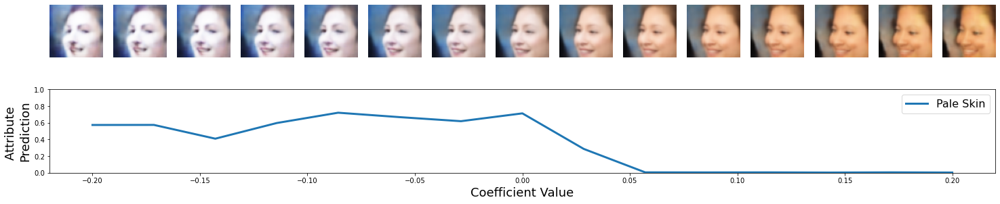

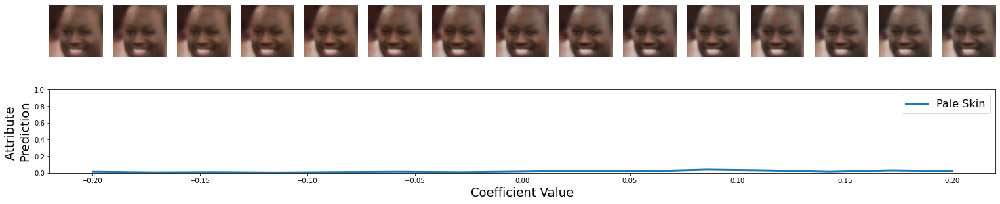

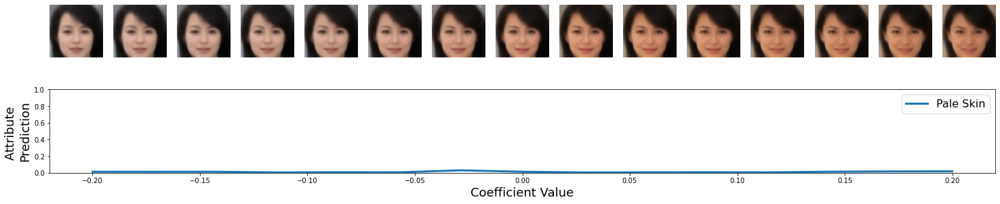

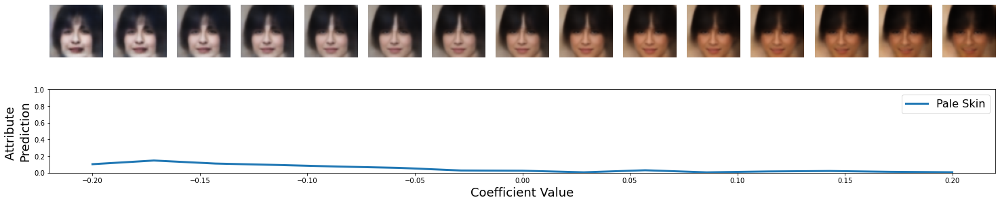

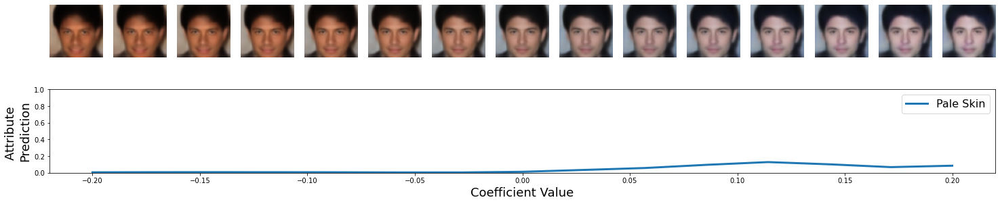

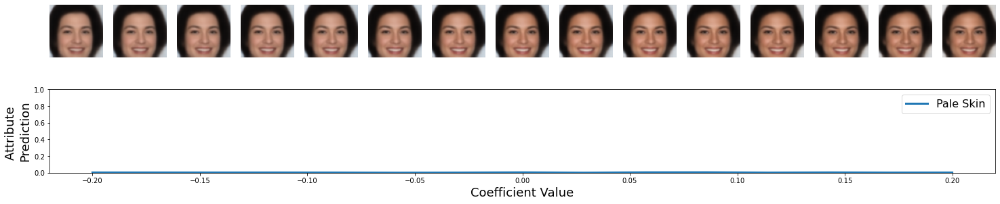

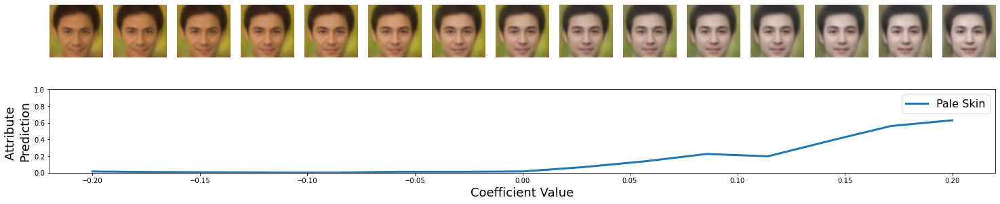

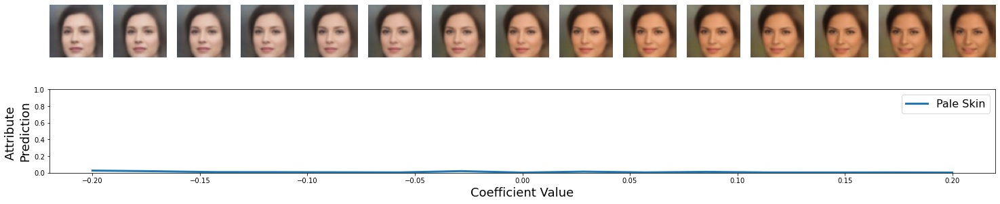

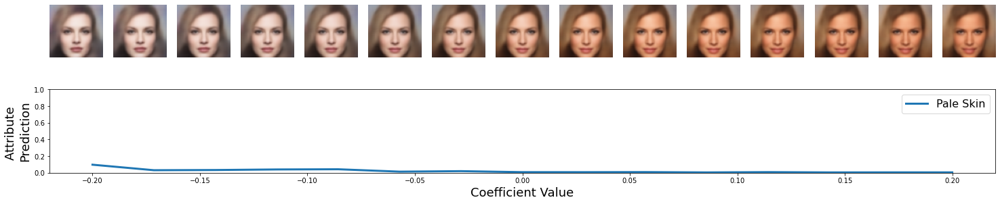

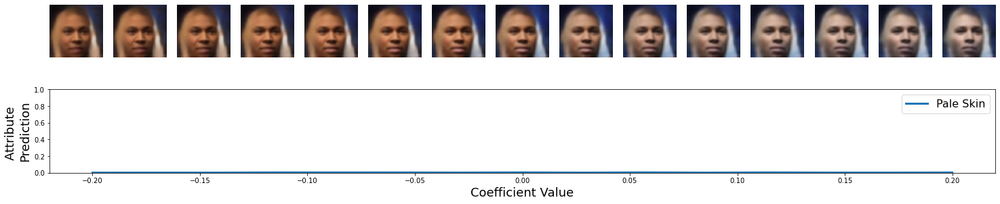

In [44]:
# Pale Skin
plot_attr_augmentations(32, [26], 0.2)

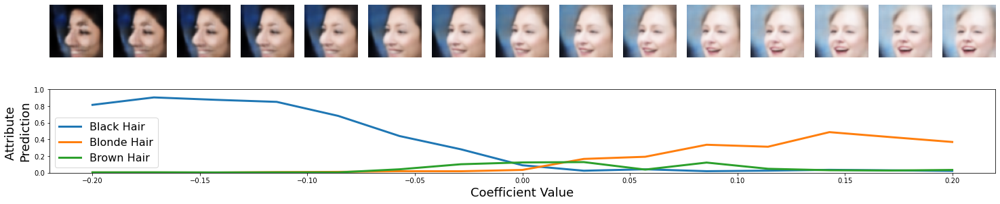

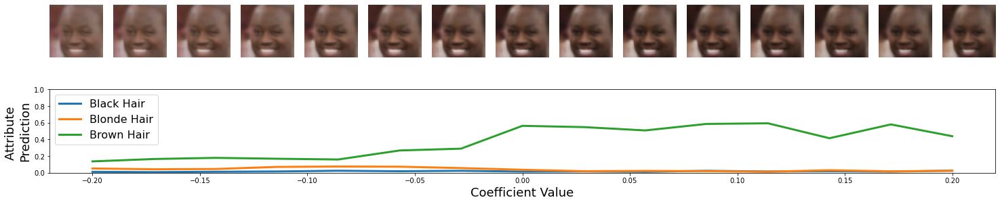

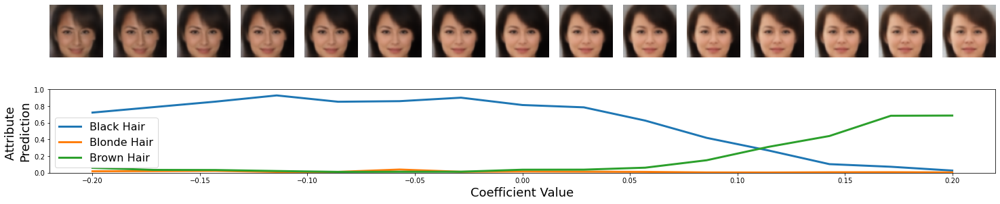

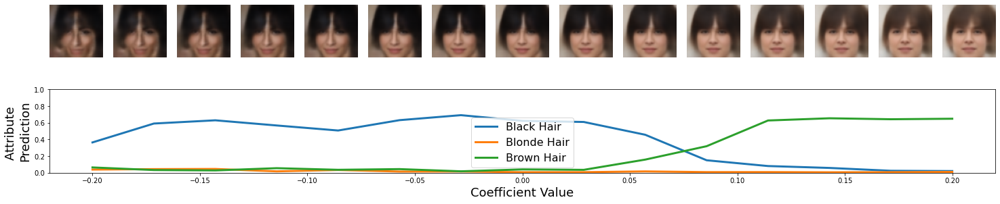

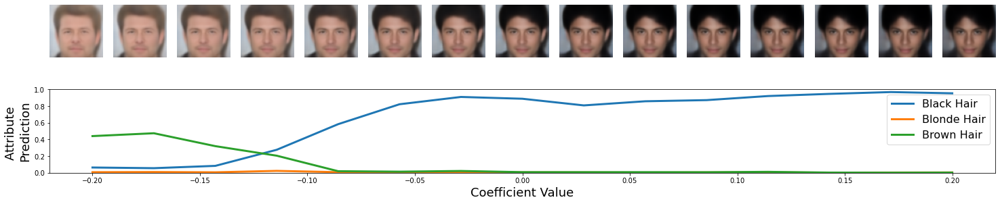

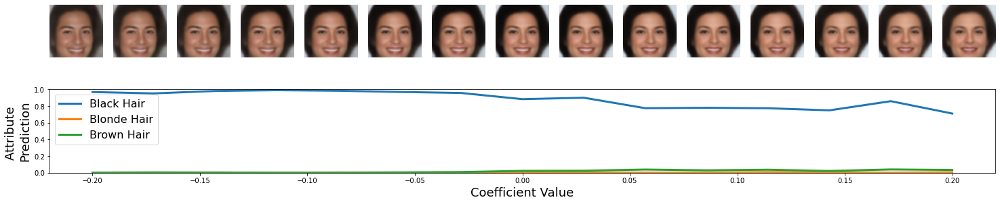

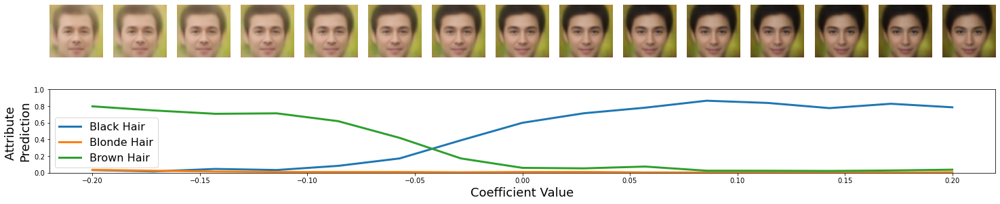

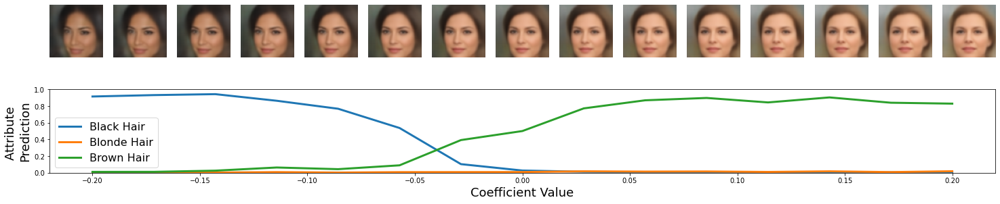

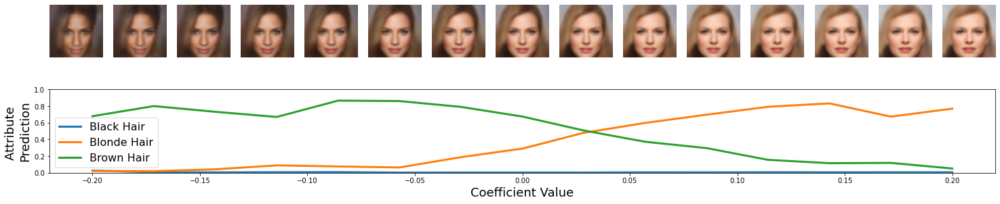

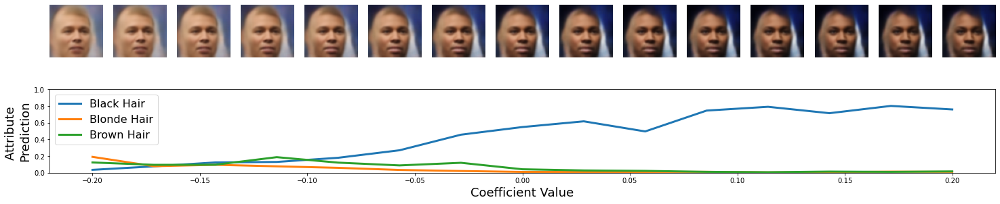

In [43]:
# Blonde, brown, and black hair color
plot_attr_augmentations(5, [8, 9, 11], 0.2)

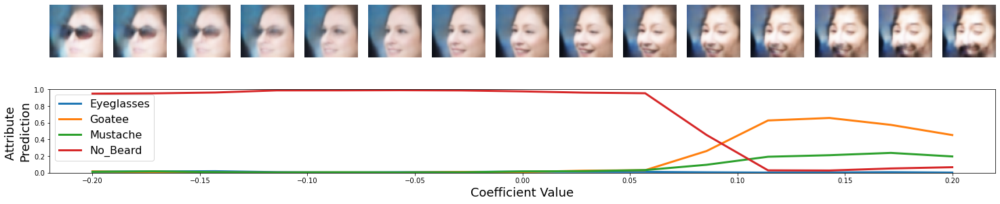

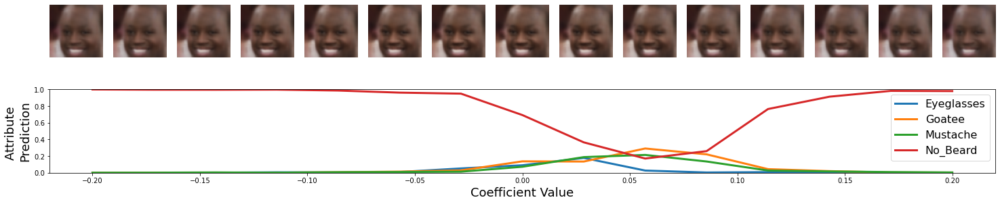

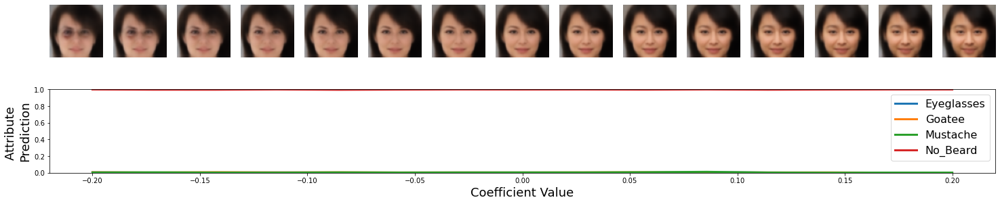

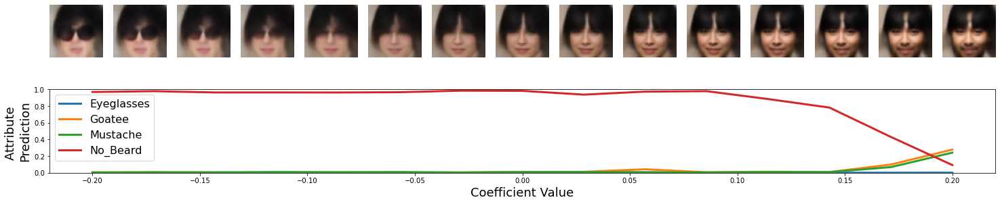

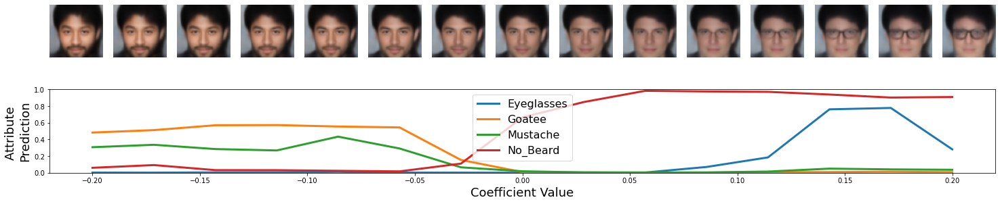

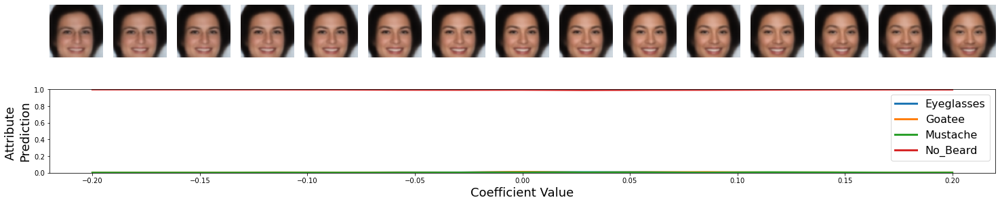

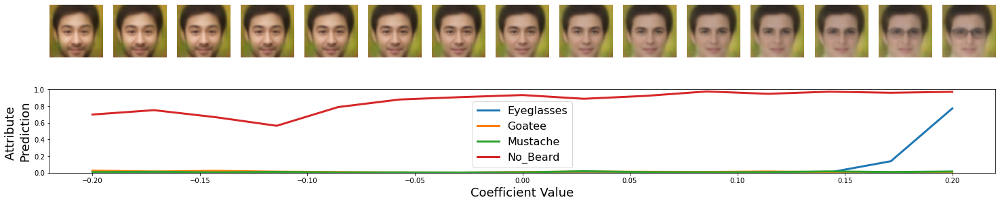

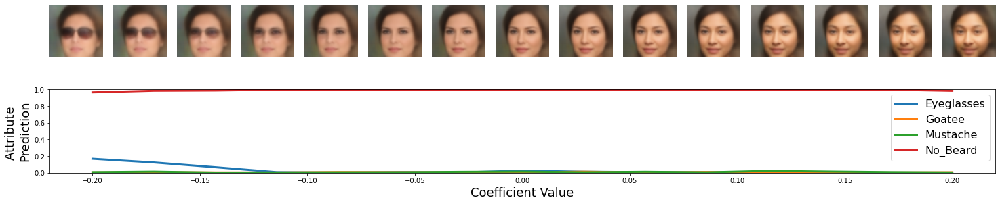

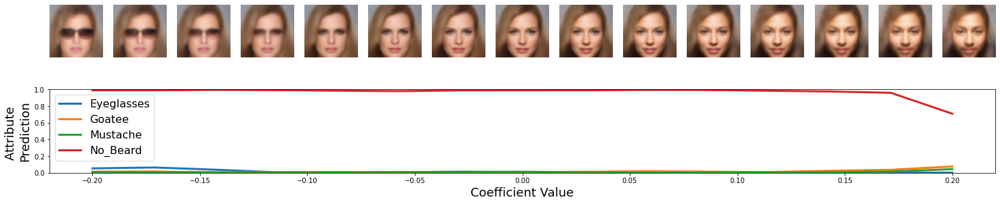

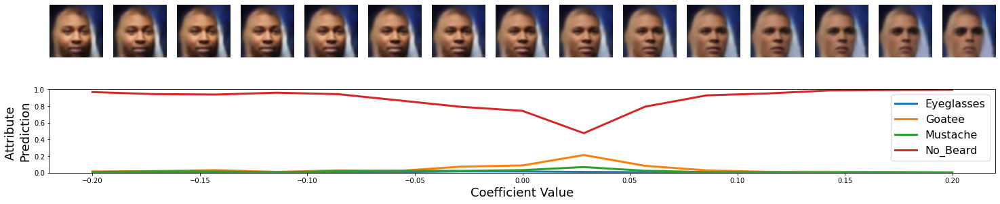

In [45]:
# Sunglasses to beard
plot_attr_augmentations(2, [15, 16, 22, 24], 0.2)